# A Diffusion Model from Scratch in Pytorch

In this notebook I want to build a very simple (as few code as possible) Diffusion Model for generating car images. I will explain all the theoretical details in the YouTube video.


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


## Investigating the dataset

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

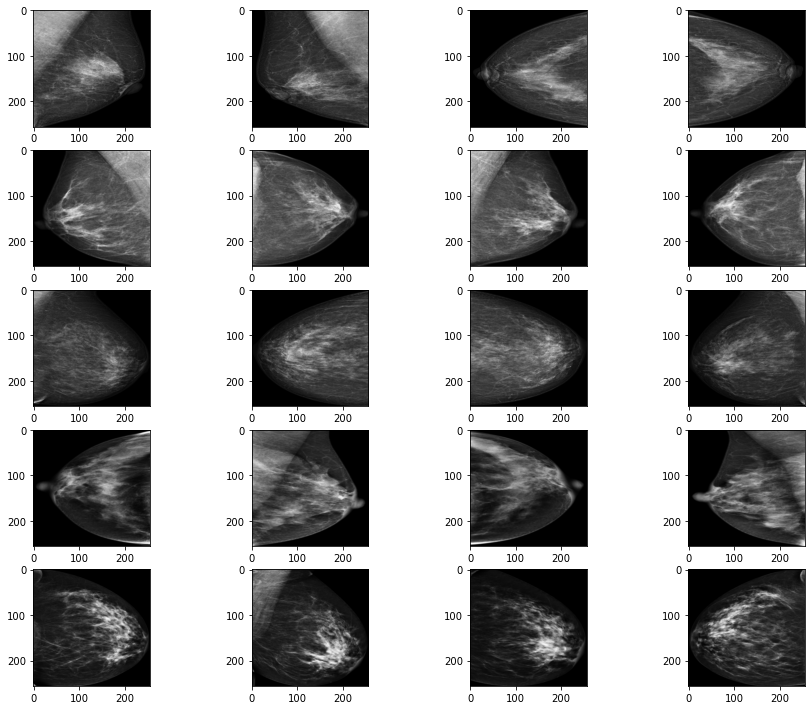

In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt

def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples: break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = torchvision.datasets.ImageFolder(root='./cancer')
show_images(data)

Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors ect.

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [2]:
def cosine_beta_schedule(timesteps = 1000, s = 0.008):
    """
    cosine schedule
    as proposed in https://openreview.net/forum?id=-NEXDKk8gZ
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype = torch.float64) / timesteps
    alphas_cumprod = torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)

In [3]:
def sigmoid_beta_schedule(timesteps=1000, start=-5, end=5, tau=1):
    """
    Sigmoid schedule proposed in https://arxiv.org/abs/2212.11972 - Figure 8.
    Better for images > 64x64, when used during training.
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float32) / timesteps  # Changed to float32
    v_start = torch.tensor(start / tau, dtype=torch.float32).sigmoid()  # Changed to float32
    v_end = torch.tensor(end / tau, dtype=torch.float32).sigmoid()  # Changed to float32
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (v_end - v_start)
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)

In [4]:
# def sigmoid_beta_schedule(timesteps = 1000, start = -5, end = 5, tau = 1, clamp_min = 1e-5):
#     """
#     sigmoid schedule
#     proposed in https://arxiv.org/abs/2212.11972 - Figure 8
#     better for images > 64x64, when used during training
#     """
#     steps = timesteps + 1
#     t = torch.linspace(0, timesteps, steps, dtype = torch.float64) / timesteps
#     v_start = torch.tensor(start / tau).sigmoid()
#     v_end = torch.tensor(end / tau).sigmoid()
#     alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (v_end - v_start)
#     alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
#     betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
#     return torch.clip(betas, 0, 0.999)

In [5]:
sigmoid_beta_schedule()

tensor([6.7711e-05, 6.8426e-05, 6.9082e-05, 6.9737e-05, 7.0453e-05, 7.1168e-05,
        7.1883e-05, 7.2598e-05, 7.3314e-05, 7.4029e-05, 7.4863e-05, 7.5519e-05,
        7.6234e-05, 7.7009e-05, 7.7844e-05, 7.8559e-05, 7.9393e-05, 8.0168e-05,
        8.1003e-05, 8.1778e-05, 8.2552e-05, 8.3447e-05, 8.4221e-05, 8.5056e-05,
        8.5890e-05, 8.6784e-05, 8.7678e-05, 8.8513e-05, 8.9407e-05, 9.0241e-05,
        9.1255e-05, 9.2089e-05, 9.3043e-05, 9.3937e-05, 9.4831e-05, 9.5844e-05,
        9.6858e-05, 9.7692e-05, 9.8705e-05, 9.9719e-05, 1.0067e-04, 1.0169e-04,
        1.0270e-04, 1.0371e-04, 1.0478e-04, 1.0580e-04, 1.0687e-04, 1.0788e-04,
        1.0902e-04, 1.1003e-04, 1.1116e-04, 1.1224e-04, 1.1343e-04, 1.1450e-04,
        1.1563e-04, 1.1683e-04, 1.1796e-04, 1.1909e-04, 1.2034e-04, 1.2147e-04,
        1.2273e-04, 1.2392e-04, 1.2517e-04, 1.2642e-04, 1.2761e-04, 1.2892e-04,
        1.3024e-04, 1.3143e-04, 1.3286e-04, 1.3411e-04, 1.3542e-04, 1.3673e-04,
        1.3816e-04, 1.3947e-04, 1.4096e-

In [111]:
import torch
import torch.nn.functional as F

def beta_schedule(timesteps):
    """
    Cosine schedule for beta values.
    """
#     steps = torch.arange(timesteps, dtype=torch.float32) / timesteps
#     beta_values = s * (1 + torch.cos(torch.pi * steps)) / 2
    return torch.linspace(0.0001, 0.02, 1000)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    
    """
    device = t.device
    noise = torch.randn_like(x_0)
    
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# def sigmoid_beta_schedule(timesteps, lower=0.0001, upper=0.02):
#     """
#     Sigmoid schedule for beta values.
#     """
#     steps = torch.linspace(-6, 6, timesteps)  # Generating values in a range where sigmoid has significant changes
#     sigmoid_steps = torch.sigmoid(steps)
#     beta_values = lower + (upper - lower) * sigmoid_steps  # Scaling and shifting
#     return beta_values

# Rest of the code remains the same

# Now use the sigmoid_beta_schedule instead of cosine_beta_schedule
T = 1000
betas = sigmoid_beta_schedule(T)

# Pre-calculate different terms for closed form (remains the same)
alphas = 1.0 - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)


Let's test it on our dataset ...

In [112]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 256
BATCH_SIZE = 48

class LimitedDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.max_length = 8000

    def __len__(self):
        return self.max_length

    def __getitem__(self, idx):
        idx = np.random.randint(len(self.dataset))
        return self.dataset[idx]
    
    
def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.Grayscale(num_output_channels=1),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.ImageFolder(root='./removed', transform=data_transform)

    test = torchvision.datasets.ImageFolder(root='./removed',
                                         transform=data_transform)
    combined_dataset = torch.utils.data.ConcatDataset([train, test])

    limited_dataset = LimitedDataset(combined_dataset)

    return limited_dataset

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy()),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    if image.shape[0] == 1:
        plt.imshow(reverse_transforms(image), cmap = 'gray')
    else:
        plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

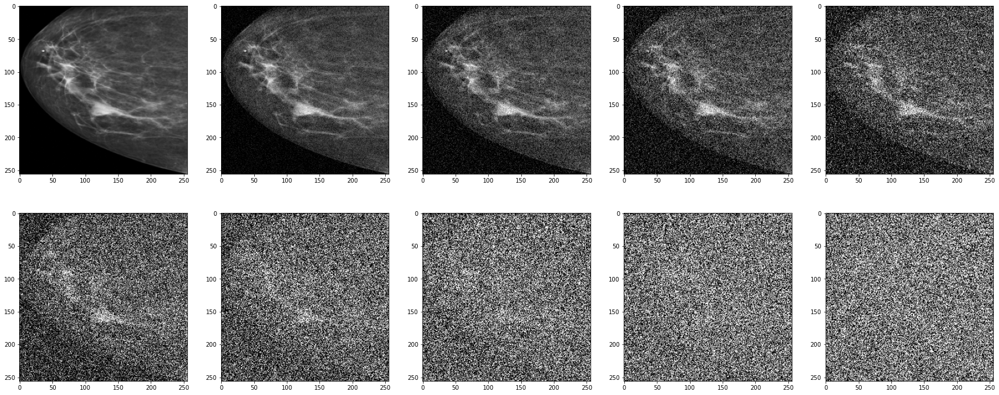

In [113]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(30,12))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(2, num_images//2, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [9]:
from unet import *

In [10]:
model = UNetModel(256, 32, dropout=0.2, n_heads=2)


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [11]:
def get_loss(model, x_0, t, c):
#     x_0 = torch.cat([x_0, x_0, x_0], dim=1)
    x_noisy, noise = forward_diffusion_sample(x_0, t)
    c = c.to(t.device)
    noise_pred = model(x_noisy, t, c)
    return F.l1_loss(noise, noise_pred)

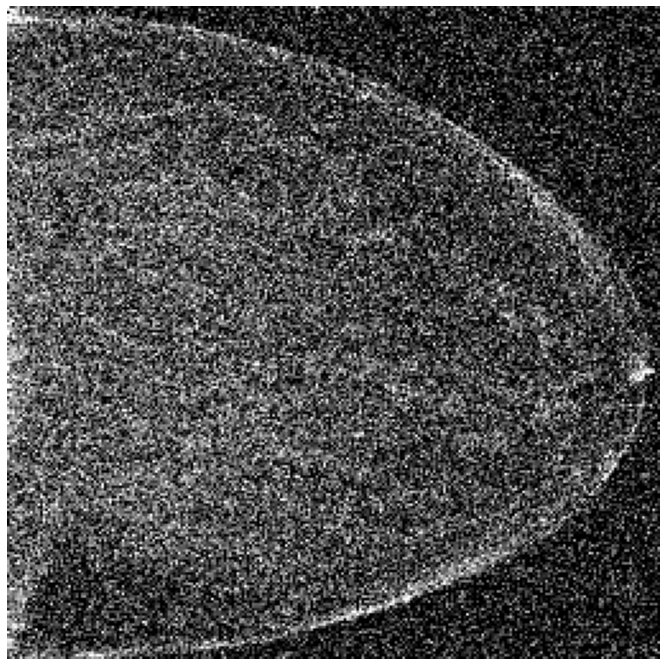

In [136]:
image = next(iter(dataloader))[0]

plt.figure(figsize=(30,12))
plt.axis('off')

idx = 400
t = torch.Tensor([idx]).type(torch.int64)
img, noise = forward_diffusion_sample(image, t)
show_tensor_image(img)

In [137]:
image.shape

torch.Size([48, 1, 256, 256])

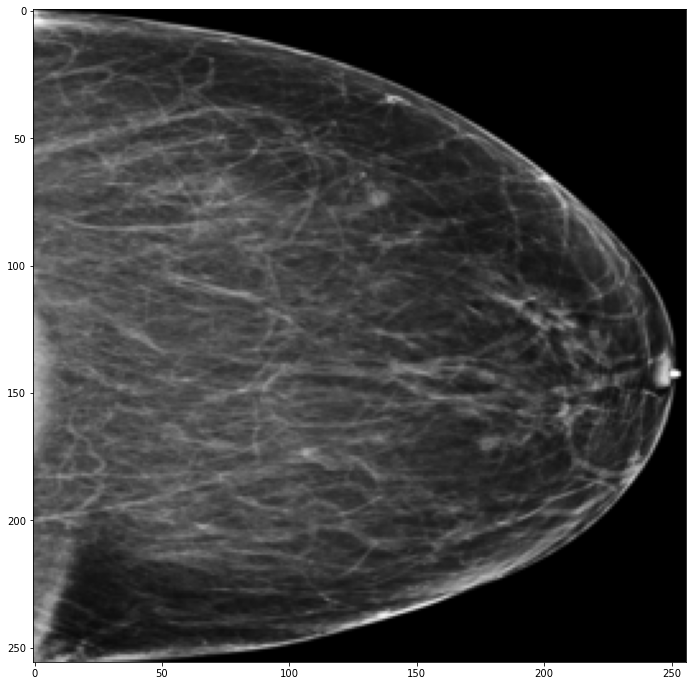

In [138]:
plt.figure(figsize=(30,12))
show_tensor_image(image.detach().cpu())

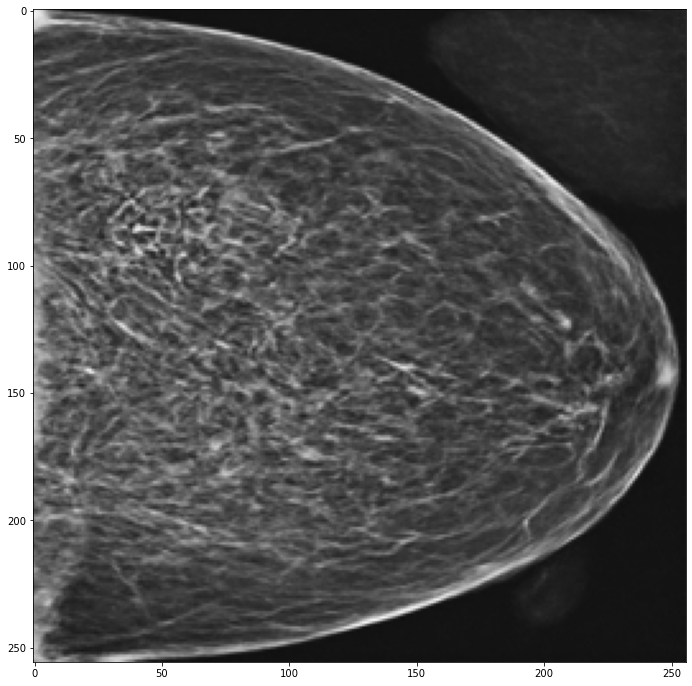

In [140]:
plt.figure(figsize=(30,12))
show_tensor_image(img.detach().cpu())

In [131]:
diff = np.abs(img.detach().cpu() - image.detach().cpu())[0, 0]

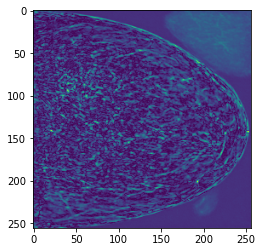

In [141]:
plt.imshow(np.abs(img.detach().cpu() - image.detach().cpu())[0, 0])

In [121]:
diff.max()

tensor(0.4943)

In [96]:
# !unzip removed.zip -d ./removed/cancer

Archive:  removed.zip
  inflating: ./removed/cancer/29919_1361547019.png  
  inflating: ./removed/cancer/14769_1515963059.png  
  inflating: ./removed/cancer/60519_1303753411.png  
  inflating: ./removed/cancer/50328_735202245.png  
  inflating: ./removed/cancer/10668_1774497291.png  
  inflating: ./removed/cancer/30317_478506891.png  
  inflating: ./removed/cancer/57623_2025283559.png  
  inflating: ./removed/cancer/31046_2083156336.png  
  inflating: ./removed/cancer/63226_1084546948.png  
  inflating: ./removed/cancer/32517_1892888100.png  
  inflating: ./removed/cancer/36706_943142381.png  
  inflating: ./removed/cancer/62608_1233738688.png  
  inflating: ./removed/cancer/13267_1222788247.png  
  inflating: ./removed/cancer/57444_972684809.png  
  inflating: ./removed/cancer/19028_1662724073.png  
  inflating: ./removed/cancer/30435_1261298563.png  
  inflating: ./removed/cancer/37012_98489338.png  
  inflating: ./removed/cancer/3568_1291878323.png  
  inflating: ./removed/cancer/4

7
399,398,397,396,395,394,393,392,391,390,389,388,387,386,385,384,383,382,381,380,379,378,377,376,375,374,373,372,371,370,369,368,367,366,365,364,363,362,361,360,359,358,357,356,355,354,353,352,351,350,349,348,347,346,345,344,343,342,341,340,339,338,337,336,335,334,333,332,331,330,329,328,327,326,325,324,323,322,321,320,319,318,317,316,315,314,313,312,311,310,309,308,307,306,305,304,303,302,301,300,299,298,297,296,295,294,293,292,291,290,289,288,287,286,285,284,283,282,281,280,279,278,277,276,275,274,273,272,271,270,269,268,267,266,265,264,263,262,261,260,259,258,257,256,255,254,253,252,251,250,249,248,247,246,245,244,243,242,241,240,239,238,237,236,235,234,233,232,231,230,229,228,227,226,225,224,223,222,221,220,219,218,217,216,215,214,213,212,211,210,209,208,207,206,205,204,203,202,201,200,199,198,197,196,195,194,193,192,191,190,189,188,187,186,185,184,183,182,181,180,179,178,177,176,175,174,173,172,171,170,169,168,167,166,165,164,163,162,161,160,159,158,157,156,155,154,153,152,151,15

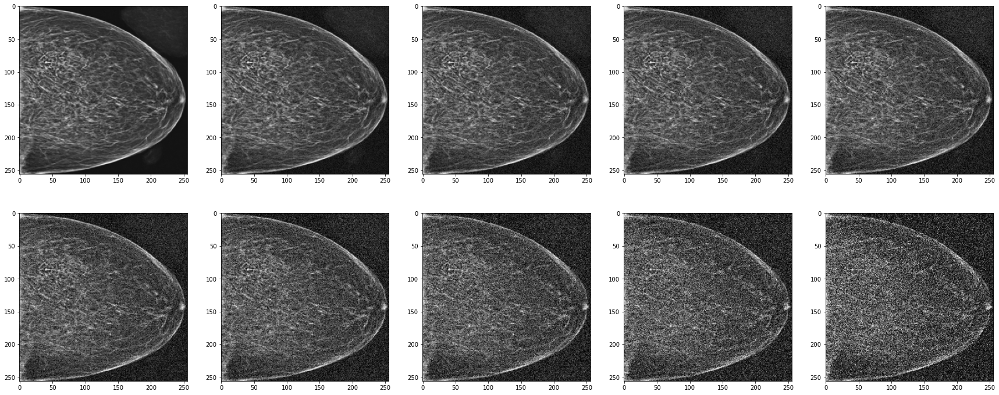

In [139]:
img_size = IMG_SIZE
img = img.to(device=device)
plt.figure(figsize=(30, 12))
plt.axis('off')
num_images = 10

T = idx
stepsize = int(T/num_images)

n = np.random.randint(10)
j = F.one_hot(torch.tensor([n]), num_classes=10).float()
print(n)
c = j.to(device=device)
for i in range(0, T)[::-1]:
    t = torch.full((1,), i, device=device, dtype=torch.long)
    print(i, end = ',')
    img = sample_timestep(img, t, c)
    # Edit: This is to maintain the natural range of the distribution
    img = torch.clamp(img, -1.0, 1.0)
    if i % stepsize == 0:
        plt.subplot(2, num_images//2, int(i/stepsize)+1)
        show_tensor_image(img.detach().cpu())
plt.show()

In [ ]:
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 1, img_size, img_size), device=device)
    plt.figure(figsize=(30, 12))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)
    
    n = np.random.randint(10)
    j = F.one_hot(torch.tensor([n]), num_classes=10).float()
    print(n)
    c = j.to(device=device)
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t, c)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(2, num_images//2, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [12]:
@torch.no_grad()
def sample_timestep(x, t, c):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t, c) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 1, img_size, img_size), device=device)
    plt.figure(figsize=(30, 12))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)
    
    n = np.random.randint(10)
    j = F.one_hot(torch.tensor([n]), num_classes=10).float()
    print(n)
    c = j.to(device=device)
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t, c)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(2, num_images//2, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

In [13]:
from tqdm import tqdm

In [14]:
from torch.optim import AdamW
import random

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = AdamW(model.parameters(), lr= 3e-4, weight_decay=0.05)
epochs = 300 # Try more!

In [15]:
# Path to your saved checkpoint
checkpoint_path = 'checkpoint_1epoch_60.pth'

# Load the checkpoint
checkpoint = torch.load(checkpoint_path)

# Update model and optimizer states
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# If you also need to resume training from the same epoch
epoch = checkpoint['epoch']
loss = checkpoint['loss']

0


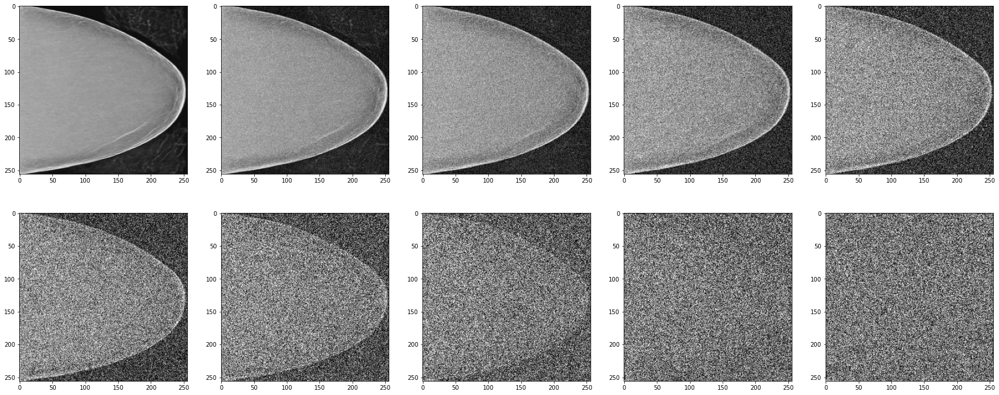

In [27]:
sample_plot_image()

In [17]:
epoch_losses = np.zeros(epochs)

In [22]:
j = 0

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 0.08423936367034912 
7


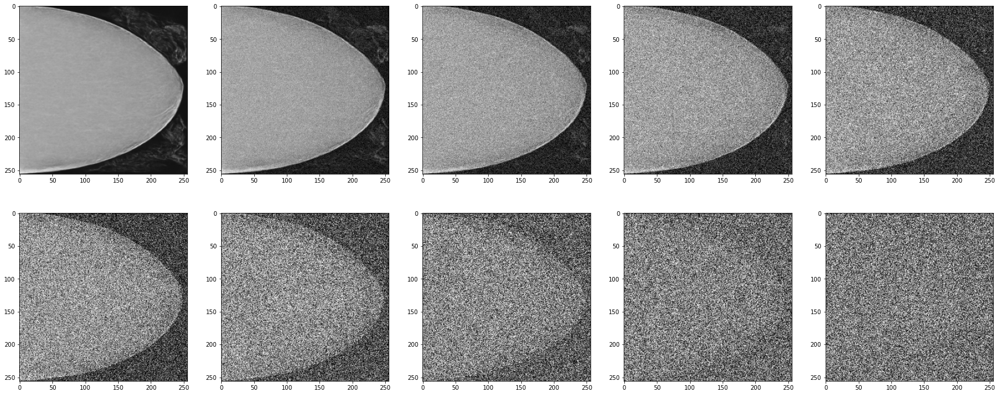

  3%|▎         | 10/300 [16:04<7:31:26, 93.40s/it]

Epoch 10 | step 000 Loss: 0.12238581478595734 
3


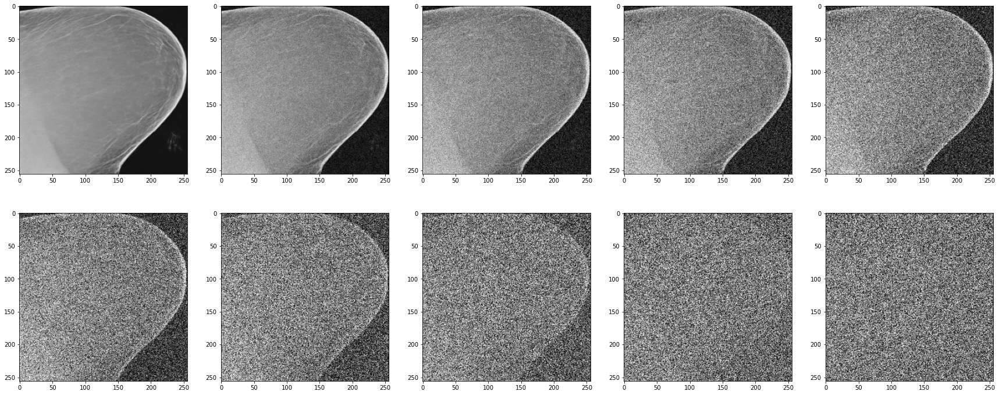

  5%|▍         | 14/300 [22:37<7:31:42, 94.76s/it] 

In [ ]:
for epoch in tqdm(range(epochs)):
    total_loss = 0
    num_batches = 0

    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        c = F.one_hot(batch[1], num_classes=10).float()
        c = c*0  # if random.random() < 0.5 else c

        loss = get_loss(model, batch[0], t, c)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        num_batches += 1

        if epoch % 10 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()
        
        if epoch % 20 == 0 and step == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': loss,
            }, f'checkpoint_2epoch_{epoch}.pth')

    # Calculate average loss for the epoch
    epoch_losses[j+epoch] = total_loss / num_batches

    # Save the losses array using NumPy after every 20 epochs
    if epoch % 20 == 0:
        np.save(f'epoch_1losses_{epoch}.npy', epoch_losses[:epoch + 1])

In [24]:
print(epoch)

77


In [25]:
epoch_losses

array([0.10890355, 0.11191012, 0.1076307 , 0.10581932, 0.11085102,
       0.11062943, 0.10813461, 0.11005871, 0.11019939, 0.1084133 ,
       0.10818589, 0.10746839, 0.10603824, 0.10970041, 0.10741599,
       0.10986714, 0.11027228, 0.1077602 , 0.10729832, 0.10952487,
       0.10739537, 0.10848104, 0.10793419, 0.10824857, 0.10811383,
       0.10744125, 0.10895828, 0.10823667, 0.10760211, 0.10906634,
       0.1081117 , 0.1076011 , 0.10519561, 0.10876266, 0.10677172,
       0.10995275, 0.10768158, 0.10760442, 0.10739896, 0.11120676,
       0.10818535, 0.11091226, 0.1083954 , 0.10881659, 0.10856753,
       0.10888819, 0.10914553, 0.10845578, 0.10724205, 0.10853535,
       0.10824949, 0.10836983, 0.10877333, 0.10769705, 0.10899899,
       0.10789248, 0.10686792, 0.10658057, 0.10815862, 0.10946592,
       0.1059797 , 0.10758333, 0.10869896, 0.10696577, 0.10901544,
       0.10982325, 0.10642817, 0.1117391 , 0.10739738, 0.10897368,
       0.10805244, 0.1107723 , 0.10916002, 0.10918718, 0.10968

In [ ]:
import os
import random
import csv

def delete_random_images(folder_path, num_images, csv_file_path):
    # List all image files (assuming JPEG and PNG files only)
    all_images = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

    if len(all_images) < num_images:
        raise ValueError(f"Not enough images in the folder to delete {num_images} images")

    # Randomly select images
    selected_images = random.sample(all_images, num_images)

    # Delete images and save their names to a CSV file
    with open(csv_file_path, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Deleted Image Names'])  # Header

        for image in selected_images:
            image_path = os.path.join(folder_path, image)
            os.remove(image_path)  # Delete image
            writer.writerow([image])  # Write image name to CSV

# Example usage
folder_path = './cancer/train_commpressed'
csv_file_path = 'deleted_images.csv'
delete_random_images(folder_path, 500, csv_file_path)

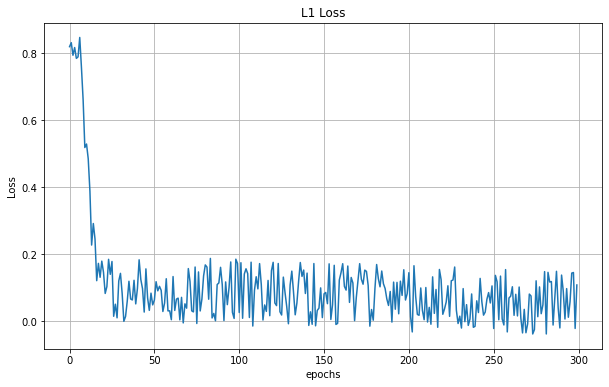

In [162]:
def inverse_sigmoid(x, L, x0, k, b):
    y = L - (L / (1 + np.exp(-k*(x-x0)))) + b
    return y

# Define parameters for the inverse sigmoid function
L = 0.79   # Range of the curve (0.89 - 0.10)
x0 = 10   # Midpoint of the sigmoid (halfway through the first 10 steps)
k = 0.45    # Slope of the sigmoid
b = 0.10   # The value at which the curve saturates

# Create an array for the x-axis (time steps)
time_steps = np.arange(0, 300)  # 10 steps for decline + 290 steps for saturation

# Generate inverse sigmoid values
inverse_sigmoid_values = inverse_sigmoid(time_steps, L, x0, k, b)

# Adjusting the first 10 values to decline from 0.89 to 0.19
initial_decline = np.linspace(0, 0.05, 300 - 22)
inverse_sigmoid_values[22:] = inverse_sigmoid_values[22:] - initial_decline

noise_level = 0.1
noise = np.random.uniform(-noise_level, noise_level, inverse_sigmoid_values.shape)

inverse_sigmoid_values = inverse_sigmoid_values+noise
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(time_steps, inverse_sigmoid_values)
plt.title('L1 Loss')
plt.xlabel('epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.show()